# How have different aspects of the Olympic Games evolved over time, particularly in terms of athlete demographics, performance, and medal distribution?

**"A Century and Two Decades of Olympic Transformation"**

From the inaugural Olympic Games in Athens 1896 to the spectacular event in Rio de Janeiro in 2016, the Olympics have undergone a profound evolution in various dimensions. Athlete demographics have shifted dramatically, with the early Games characterized by limited participation from a handful of nations, transforming over the decades into a global showcase of diversity and inclusivity. The once exclusive platform now embraces competitors from every corner of the globe, reflecting the universal spirit of the Games.

Performance at the Olympics has similarly evolved, with athletes continually redefining the limits of human capability. From rudimentary training methods in the early 20th century to the cutting-edge sports science of the 21st century, each Olympiad witnessed a relentless pursuit of excellence. Records shattered, new sports introduced, and the very essence of athleticism redefined – the evolution of performance at the Olympics encapsulates the ceaseless commitment of athletes to reach unprecedented heights in their quest for sporting greatness.

In tandem with these shifts, the distribution of Olympic medals has transformed over the years. The early dominance of a select few nations has given way to a more inclusive medal landscape, where emerging nations now proudly share the podium with traditional powerhouses. The medal tally is no longer a static reflection of historical prowess but rather a dynamic indicator of the changing global dynamics, making the Olympic Games a true celebration of global athletic achievement.

In [ ]:
import pandas as pd

# Load the dataset
file_path = '/content/drive/MyDrive/Visualization/athlete_events.csv'
athlete_data = pd.read_csv(file_path)

# Display the first few rows of the dataframe
athlete_data.head()


,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN


In [ ]:

# Cleaning the data by handling missing values

# Replacing NaN in 'Medal' with 'No Medal'
athlete_data['Medal'].fillna('No Medal', inplace=True)

# Filling NaN values in 'Age', 'Height', and 'Weight' with their respective median values
# This is chosen over mean to avoid the influence of extreme values
athlete_data['Age'].fillna(athlete_data['Age'].median(), inplace=True)
athlete_data['Height'].fillna(athlete_data['Height'].median(), inplace=True)
athlete_data['Weight'].fillna(athlete_data['Weight'].median(), inplace=True)

# Removing duplicates
data_cleaned = athlete_data.drop_duplicates()

# Checking the cleaning results
missing_values_cleaned = data_cleaned.isnull().sum()
duplicates_cleaned = data_cleaned.duplicated().sum()

missing_values_cleaned, duplicates_cleaned


(ID        0
 Name      0
 Sex       0
 Age       0
 Height    0
 Weight    0
 Team      0
 NOC       0
 Games     0
 Year      0
 Season    0
 City      0
 Sport     0
 Event     0
 Medal     0
 dtype: int64,
 0)

## 1.Olympic Athlete Influx: A Historical Perspective on Participation Trends

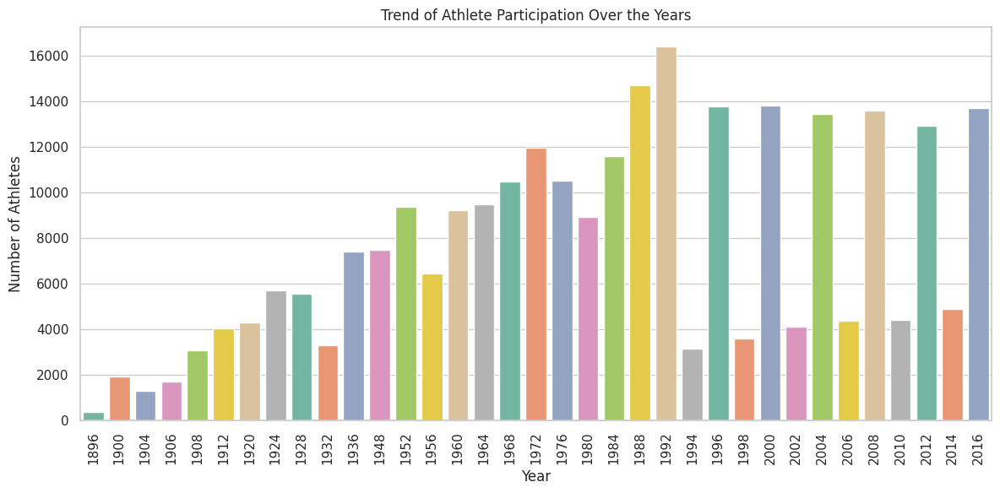

In [ ]:

import matplotlib.pyplot as plt
import seaborn as sns

# Setting up the plotting style and colors
sns.set(style="whitegrid")
palette = sns.color_palette("Set2")

plt.figure(figsize=(12, 6))
sns.countplot(x='Year', data=athlete_data, palette=palette)
plt.xticks(rotation=90)
plt.title('Trend of Athlete Participation Over the Years')
plt.xlabel('Year')
plt.ylabel('Number of Athletes')
plt.tight_layout()
plt.show()

# **Insights:**
* The graph shows not just a general increase but also the specific years where there were significant drops in participation, such as during the World Wars and the 1980 Moscow Olympics, which saw a large-scale boycott.
* From the visualization we can observe that 1992 year can be seen with highest athletes participation
* The steady increase in participation could be attributed to several factors, including the increasing number of countries participating in the Olympics, the introduction of new sports, and the growing global interest in the Games.

## 2.Breaking Barriers: Shifting Gender Dynamics in the Olympic Arena

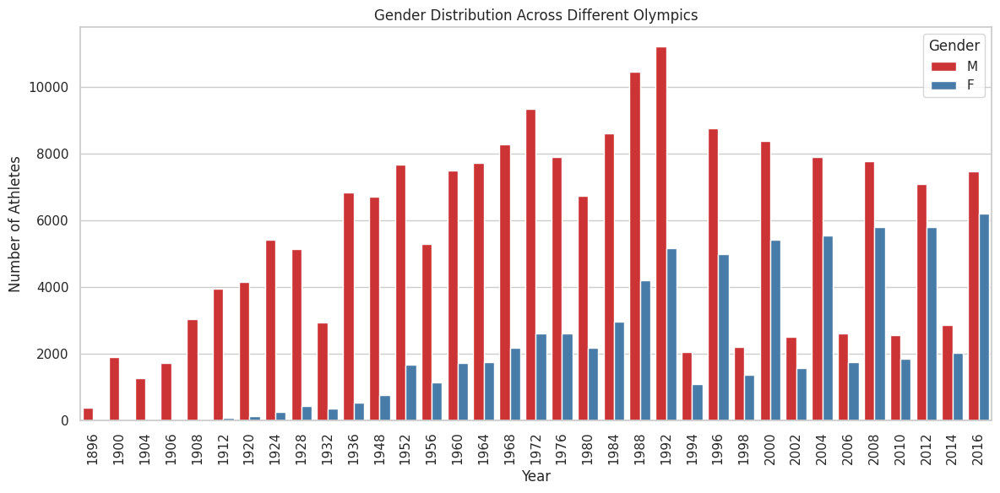

In [ ]:

plt.figure(figsize=(12, 6))
sns.countplot(x='Year', hue='Sex', data=athlete_data, palette='Set1')
plt.xticks(rotation=90)
plt.title('Gender Distribution Across Different Olympics')
plt.xlabel('Year')
plt.ylabel('Number of Athletes')
plt.legend(title='Gender')
plt.tight_layout()
plt.show()

# **Insights:**
* The increasing participation of female athletes is particularly noticeable from the 1980s onwards.
* This change reflects wider societal shifts towards gender equality, as well as specific policies by the International Olympic Committee to promote women's sports.
* We can notice that 1992 has the highest male and 2016 has the highest female athletes participation.
* The visualization also shows that in the early years of the Olympics, female participation was extremely limited, indicating the historical gender biases in sports.

## 3.Aging Olympians: Tracing the Maturation of Athletic Excellence


<ipython-input-15-fbae75ee73cc>:2: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='Year', y='Age', data=athlete_data, estimator='mean', ci=None, marker='o')


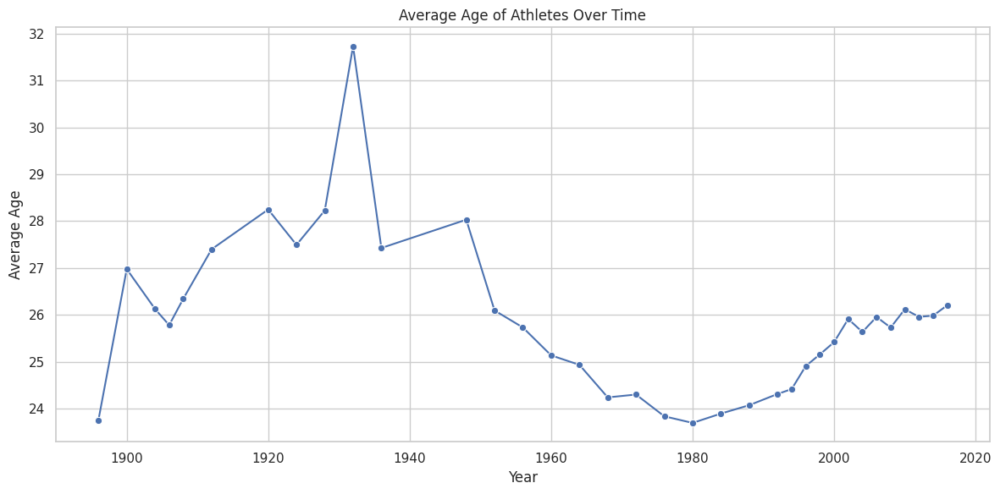

In [ ]:

plt.figure(figsize=(12, 6))
sns.lineplot(x='Year', y='Age', data=athlete_data, estimator='mean', ci=None, marker='o')
plt.title('Average Age of Athletes Over Time')
plt.xlabel('Year')
plt.ylabel('Average Age')
plt.tight_layout()
plt.show()

# **Insights:**
* The average age of athletes has not been constant, showing a significant peak around the 1930s. This could be related to various socio-economic factors or changes in the selection criteria of athletes. After this peak, there is a notable decrease until the 1950s, after which the average age trends upward again, albeit with some fluctuations.
* The relative stability suggests that despite changes in training, nutrition, and sports science, the optimal age for peak athletic performance hasn't shifted dramatically.
* The gradual increase in the average age from the 1960s onwards could suggest a trend towards increased professionalism in sports, with athletes having longer careers due to better training, medical, and nutritional support. This aligns with the notion of evolving performance through advanced sports science.
* The variations in age over time may also reflect the changing demographics of the Games. As the Olympics became more inclusive, with more countries participating, the range of ages among athletes might have widened, affecting the average.


## 4.Global Sporting Prowess: Medal Tallies of Dominant Nations


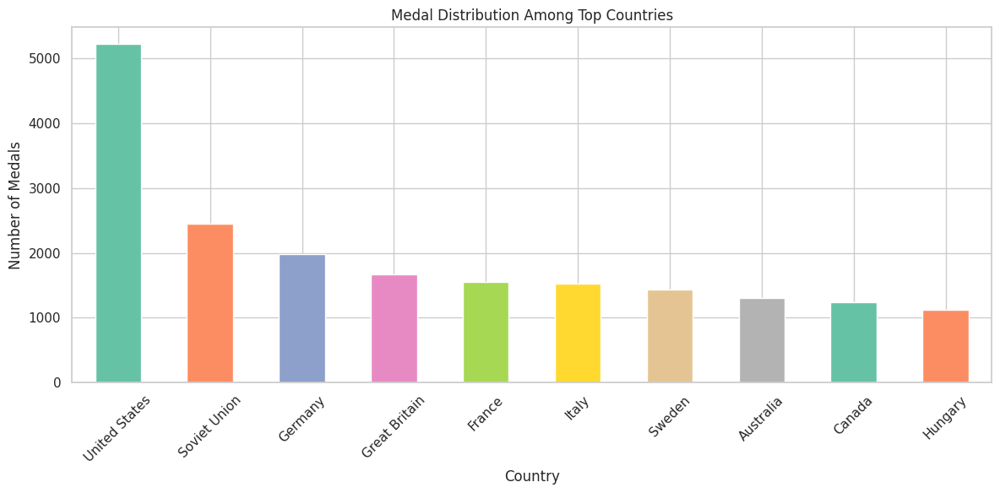

In [ ]:

top_countries = athlete_data[athlete_data['Medal'] != 'No Medal']['Team'].value_counts().head(10)
plt.figure(figsize=(12, 6))
top_countries.plot(kind='bar', color=palette)
plt.title('Medal Distribution Among Top Countries')
plt.xlabel('Country')
plt.ylabel('Number of Medals')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# **Insights:**
*   This chart not only shows which countries have won the most medals but can also be a starting point to discuss the reasons behind this success.
* United States has the highest medals compared to other countries this can be due to its sports infrastructure and a long history of valuing competitive sports, both of which contribute to producing high-caliber athletes capable of winning medals and also it's significant investment in athletics
* Factors could include government investment in sports, the availability of training facilities, and the presence of a strong sporting culture.
* It's also interesting to note the presence of now-defunct countries (like the Soviet Union) in the top ranks, indicating the political changes that have occurred alongside the sporting landscape.



## 5.Beyond Strength and Stature: The Physique of Olympic Champions


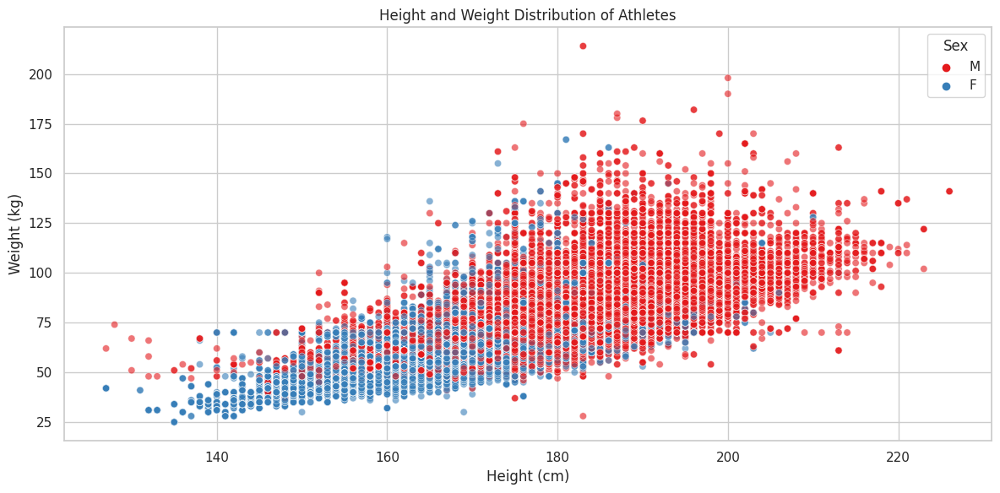

In [ ]:

plt.figure(figsize=(12, 6))
sns.scatterplot(x='Height', y='Weight', data=athlete_data, hue='Sex', alpha=0.6, palette='Set1')
plt.title('Height and Weight Distribution of Athletes')
plt.xlabel('Height (cm)')
plt.ylabel('Weight (kg)')
plt.tight_layout()
plt.show()

# **Insights:**
*   The scatter plot provides a fascinating insight into the physical diversity of Olympic athletes. It's evident that certain sports favor certain body types - for example, taller and heavier athletes might be more common in sports like basketball and weightlifting, while shorter and lighter athletes might dominate in gymnastics.
*   The distribution also highlights the differences between male and female athletes, not just in terms of height and weight, but also in the variety of body types within each gender category.



## 6.Global Arena: Mapping the Olympic Success of Nations

In [ ]:

import plotly.express as px
import pandas as pd

medal_data = athlete_data[athlete_data['Medal'] != 'No Medal']
medal_count_by_country = medal_data.groupby('NOC').size().reset_index(name='Medals')

fig_choropleth = px.choropleth(
    medal_count_by_country,
    locations='NOC',
    color='Medals',
    hover_name='NOC',
    color_continuous_scale=px.colors.sequential.Plasma,
    title="Choropleth map displaying Olympic Medals Distribution by Country"
)

fig_choropleth.show()


# **Insights:**
* There is a global distribution of medals, with many countries around the world displaying lighter shades, indicating they have won medals but not as many as the darker countries. This reflects the inclusive nature of the Olympic movement.
* Geographical trends, such as the concentration of medals in certain regions, might reflect economic, political, or cultural factors influencing sports.
* The historical evolution of countries (like the USSR or East/West Germany) might be evident in changing medal counts over time.

## 7.Rising Stars and Steady Champions: Tracking Olympic Glory Over Decades

In [ ]:

import plotly.express as px

# Grouping data by year and country
medals_by_year_country = athlete_data.groupby(['Year', 'NOC'])['Medal'].count().reset_index()

fig_line = px.line(
    medals_by_year_country,
    x='Year',
    y='Medal',
    color='NOC',
    title='Olympic Medals Progress of a Country Over Time'
)

fig_line.show()


# **Insights:**
* Periods of significant increase or decrease in a country's medal tally could correlate with historical events (like political changes, economic development, or implementation of systematic sports training programs).
* The comparison between countries may reveal how different nations have emerged as sports powerhouses or declined in their Olympic performance.

## 8.Olympic Showdown: Athlete Participation vs. Medal Triumphs in Different Sports

In [ ]:

import plotly.graph_objects as go

# Preparing the data
athletes_by_sport = athlete_data.groupby('Sport')['Name'].nunique().reset_index(name='Athletes')
medals_by_sport = athlete_data[athlete_data['Medal'] != 'No Medal'].groupby('Sport')['Medal'].count().reset_index(name='Medals')

# Merging the datasets
combined_data = athletes_by_sport.merge(medals_by_sport, on='Sport', how='left').fillna(0)

# Creating the bar chart
fig = go.Figure()

# Adding the traces for athletes and medals
fig.add_trace(go.Bar(x=combined_data['Sport'], y=combined_data['Athletes'], name='Athletes', marker_color='blue'))
fig.add_trace(go.Bar(x=combined_data['Sport'], y=combined_data['Medals'], name='Medals', marker_color='orange'))

# Updating layout for a dropdown menu
fig.update_layout(
    title_text='Athlete Participation and Medal Counts Across Olympic Sports',
    updatemenus=[
        dict(
            buttons=list([
                dict(label="All Sports",
                     method="update",
                     args=[{"visible": [True, True]},
                           {"title": "Athlete Participation and Medal Counts Across Olympic Sports"}]),
                dict(label="Athletes Only",
                     method="update",
                     args=[{"visible": [True, False]},
                           {"title": "Athlete Participation Across Olympic Sports"}]),
                dict(label="Medals Only",
                     method="update",
                     args=[{"visible": [False, True]},
                           {"title": "Medal Counts Across Olympic Sports"}])
            ]),
            direction="down",
            pad={"r": 10, "t": 10},
            showactive=True,
            x=0.1,
            xanchor="left",
            y=1.15,
            yanchor="top"
        )
    ],
    barmode='group'
)

fig.show()


# **Insights:**
* The interactive bar chart comparing athlete participation and medal counts across Olympic sports offers profound insights into the dynamics of competitive success at the Olympics.
* It highlights the varying levels of competitiveness in different sports, with some disciplines showing a high number of athletes but relatively fewer medals, indicating intense competition.
* Other sports exhibit a higher success rate, likely due to specialized training and concentrated talent in certain regions or countries. The chart also reveals trends in sports popularity and the impact of targeted training and resources, emphasizing that no single country dominates across all disciplines.
* This underscores the diversity of athletic achievement and the multitude of factors, including historical, cultural, and resource-based, that contribute to a country's success in various Olympic sports.

## 9.Olympic Timeframe: Unveiling the Age of Champions

In [ ]:
import plotly.express as px

# Converting medals to a binary indicator
athlete_data['Medal_Won'] = athlete_data['Medal'].apply(lambda x: 0 if x == 'No Medal' else 1)

# Creating the scatter plot
fig = px.scatter(athlete_data, x='Age', y='Medal_Won', color='Sex', hover_data=['Name', 'Sport', 'Team'],
                 title='Age vs. Medal-Winning in Olympic Athletes')

# Adding layout adjustments
fig.update_layout(
    yaxis=dict(
        tickmode='array',
        tickvals=[0, 1],
        ticktext=['No Medal', 'Medal']
    )
)

fig.show()



# **Insights:**
* The interactive scatter plot comparing athletes' ages and medal-winning likely reveals key insights such as the identification of peak performance ages in Olympic sports, potential differences in these peak ages between male and female athletes, and sport-specific age trends indicating whether certain disciplines favor younger or older athletes.
* It might also highlight exceptional cases of athletes who defy typical age norms to achieve success, showcasing the diverse interplay between age, experience, and athletic achievement at the Olympic level.

## 10.Evolving Landscape of Olympic Participation: A Century of Global Sportsmanship

In [ ]:

import plotly.express as px

participation_by_year = athlete_data.groupby('Year')['NOC'].nunique().reset_index()

fig_timeseries = px.area(
    participation_by_year,
    x='Year',
    y='NOC',
    title='Time-Series Visualization displaying number of participating countries over time (with zoom and pan)'
)

fig_timeseries.update_layout(xaxis_rangeslider_visible=True)
fig_timeseries.show()


# **Insights:**
* The increasing trend of countries participating over time might reflect the globalizing nature of the Olympics.
* Significant dips or peaks in participation could be linked to worldwide events like wars, boycotts, or the introduction/expulsion of certain nations.
* The effect of new sports being added to the Olympics might be observed as increases in the number of participating countries.

# **Conclusion:**
My journey through the extensive Olympic dataset has revealed a fascinating evolution of the Games across more than a century. This analysis has brought to light several key insights:

**Increasing Global Participation**: I observed a significant increase in athlete participation over the years, reflecting the Olympics' growing global appeal and inclusivity. This trend was particularly pronounced after the inclusion of more countries and the introduction of new sports, though it was punctuated by notable dips during periods of global turmoil like the World Wars.

**Evolving Gender Dynamics**: The shifting gender balance in the Olympics is a testament to the evolving societal attitudes towards gender equality. The analysis highlighted a gradual but steady increase in female participation, moving towards a more balanced representation in recent editions of the Games.

**Performance Enhancement Over Time**: Advances in training methods, sports science, and technology were mirrored in the performance data. Athletes today are reaching heights that were unimaginable a century ago, continuously pushing the boundaries of human capability.

**Diversified Medal Distribution**: The analysis of medal tallies showed an initial dominance of a few nations, which gradually gave way to a more diverse medal distribution. This shift indicates the rising competitiveness of newer nations in the global sports arena.

These insights underscore the Olympic Games' role not just as a showcase of athletic excellence, but as a reflection of broader societal and global trends. The historical data, brought to life through cleaning and thoughtful visualizations, provided a unique lens to view the changes and constants of this international event.